%%%%%%%%%%%%%%%%%%% SONG RESCOMMENDATION SYSTEM %%%%%%%%%%%%%%%%%%%%

In [1]:
#!pip install wordcloud

In [2]:
import numpy as np
import pandas as pd
import os
import json
from zipfile import ZipFile
import re
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt
import difflib

In [3]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


In [4]:
df = pd.read_csv("spotify_millsongdata.csv.zip")

In [5]:
df

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...
...,...,...,...,...
57645,Ziggy Marley,Good Old Days,/z/ziggy+marley/good+old+days_10198588.html,Irie days come on play \r\nLet the angels fly...
57646,Ziggy Marley,Hand To Mouth,/z/ziggy+marley/hand+to+mouth_20531167.html,Power to the workers \r\nMore power \r\nPowe...
57647,Zwan,Come With Me,/z/zwan/come+with+me_20148981.html,all you need \r\nis something i'll believe \...
57648,Zwan,Desire,/z/zwan/desire_20148986.html,northern star \r\nam i frightened \r\nwhere ...


In [6]:
df = df.drop("link",axis=1).reset_index(drop = True)

In [7]:
df

,artist,song,text
0,ABBA,Ahe's My Kind Of Girl,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante","Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,Making somebody happy is a question of give an...
...,...,...,...
57645,Ziggy Marley,Good Old Days,Irie days come on play \r\nLet the angels fly...
57646,Ziggy Marley,Hand To Mouth,Power to the workers \r\nMore power \r\nPowe...
57647,Zwan,Come With Me,all you need \r\nis something i'll believe \...
57648,Zwan,Desire,northern star \r\nam i frightened \r\nwhere ...


In [8]:
import warnings
warnings.filterwarnings("ignore")

In [9]:
df = df.sample(10000)

In [10]:
combined_text = " ".join(df['text'].dropna())
print(combined_text)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [11]:
combined_text

'They call me the hunter, that\'s my nameA handsome man  \r\nlike you is my only gameI bought me a love gun just the  \r\nother dayAnd I aim to aim it your wayIt aint no use to  \r\nhideAin\'t no need to run\'Cause I got you in  \r\nthe sight of my love gunThe first time I saw ya standing on  \r\nthe streetI said to myself, oh ain\'t he sweetI  \r\ngot my love gun loaded with a hugs and kissesAnd when I  \r\npull my trigger there wont be no missesIt ain\'t  \r\nno need to hideAin\'t no use to run\'Cause  \r\nI\'ve got you in the sight of my love gunIt aint no  \r\nused to hideAin\'t no need to runCause I got you  \r\nin the sight of my love gunI\'m a big game hunter  \r\nbabyHow can I miss when I got good aimAll I ever hunt  \r\nis a big handsome manOn my way, heyThey call me the  \r\nhunter That\'s my nameA handsome man like you is  \r\nmy only gameI bought me a love gun just the other  \r\ndayAnd I aim to aim it your wayAin\'t no use  \r\nto hideAnd it aint no need to run\'Cause I\'v

In [12]:
word_cloud = WordCloud(width = 800,height = 400,background_color = "white").generate(combined_text)
print(word_cloud)

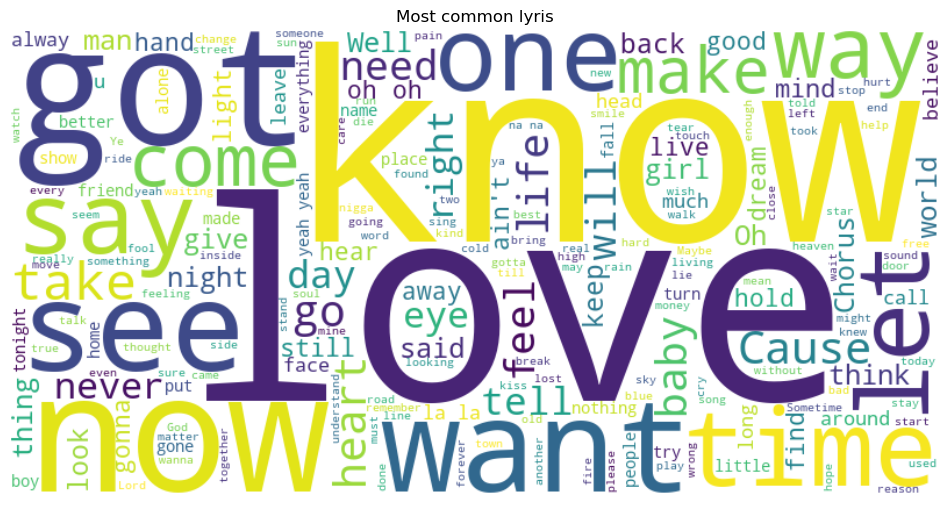

In [13]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud,interpolation = 'bilinear')
plt.axis('off')
plt.title("Most common lyris")
plt.show()

In [14]:
#nltk.download('punkt')
#nltk.download('punkt_tab')
#nltk.download('stopwords')

In [15]:
# getting the stop_words 
stop_words = set(stopwords.words("english"))


In [16]:
def preprocess_text(text):
    #removing special characters and numbers
    text = re.sub(r"[^a-zA-Z\s]"," ",text)
    # converting text to lower case
    text = text.lower()
    # tokenizing each text
    tokens = word_tokenize(text)
    #removing the stopwords from tokens
    tokens = [word for word in tokens if word not in stop_words]
    return " ".join(tokens)

In [17]:
df['cleaned_text'] = df['text'].apply(preprocess_text)

In [18]:
df

,artist,song,text,cleaned_text
53349,Tina Turner,The Hunter,"They call me the hunter, that's my nameA hands...",call hunter namea handsome man like gamei boug...
47989,Pet Shop Boys,Saturday Night Forever,I don't care what these commentators say \r\n...,care commentators say swear care difference ma...
3342,Cole Porter,Night And Day,"Night and day, you are the one \r\nOnly you b...",night day one beneath moon sun whether near fa...
47409,Patsy Cline,Fingerprints,I feel the fingerprints \r\nThat you left on ...,feel fingerprints left heart played game love ...
5837,Faces,Devotion,So good to be with \r\nThe people that know y...,good people know good hear things say times go...
...,...,...,...,...
6409,Frankie Goes To Hollywood,For Heaven's Sake,"Leave them behind, those clouds of trouble \r...",leave behind clouds trouble find world new buy...
5878,Faith Hill,Bed Of Roses,There's something 'bout your manner \r\nThat ...,something bout manner makes hard see take adva...
13830,Neil Young,Coastline,"Down on the coastline, Highway One \r\nPeople...",coastline highway one people headin sun found ...
18942,Stevie Wonder,Overjoyed,"Over time, I've been building \r\nMy castle o...",time building castle love two though never kne...


In [19]:
# converting the text data into feature vector
vectorizer = TfidfVectorizer()
feature_vector = vectorizer.fit_transform(df['cleaned_text'])
similarity = cosine_similarity(feature_vector,feature_vector)
print(similarity)

[[1.00000000e+00 3.13361953e-03 1.45308502e-02 ... 2.03440699e-03
  3.41252073e-02 1.41726303e-02]
 [3.13361953e-03 1.00000000e+00 1.58701560e-01 ... 3.32408116e-02
  2.44169021e-02 5.06795247e-04]
 [1.45308502e-02 1.58701560e-01 1.00000000e+00 ... 5.98371433e-02
  4.23510197e-02 1.18310275e-02]
 ...
 [2.03440699e-03 3.32408116e-02 5.98371433e-02 ... 1.00000000e+00
  1.36337355e-02 8.57266831e-03]
 [3.41252073e-02 2.44169021e-02 4.23510197e-02 ... 1.36337355e-02
  1.00000000e+00 2.28042991e-02]
 [1.41726303e-02 5.06795247e-04 1.18310275e-02 ... 8.57266831e-03
  2.28042991e-02 1.00000000e+00]]


In [20]:
# Based on the similarity score ythe model recommend the song for the user

In [21]:
def recommend_song(song_name, similarity = similarity, df = df , top_n = 10):
    idx = df[df["song"].str.lower() == song_name.lower()].index

    if len(idx) == 0:
        print("song not found in dataset")
    idx = idx[0]
    similarity_score = list(enumerate(similarity[idx]))
    sorted_similarity_score = sorted(similarity_score , key = lambda x : x[1],reverse  = True)
    
    sorted_similarity_score = sorted_similarity_score[ :top_n]
    ind = [song[0] for song in sorted_similarity_score]
    title_from_index = df.iloc[ind][['artist','song']]
    print(f" - {title_from_index}")
   
    

In [22]:
# Recoomending the top 10 song based the similarity score
song = input("%%%%%% ^^^^^^ Enter your favourate movie:  ")
recommend_song(song)


%%%%%% ^^^^^^ Enter your favourate movie:   Night And Day


 -                  artist                                          song
31348     Elvis Presley                         From A Jack To A King
7366          Hank Snow                         From A Jack To A King
43467          Megadeth                                 Kill The King
57333  Yngwie Malmsteen                                 Queen In Love
37467      Janis Joplin  All Is Loneliness ( In Album Magic Of Love )
43233        Mary Black                    She Moves Through The Fair
13333         Morrissey                  Striptease With A Difference
57387          Yoko Ono                                    Loneliness
26016         Bob Seger                       Loneliness Is A Feeling
48572     Planetshakers                                   King Of All
